### Importação dos dados



In [71]:
import pandas as pd
import matplotlib.pyplot as plt
import folium

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_1.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_4.csv"

loja = pd.read_csv(url)
loja2 = pd.read_csv(url2)
loja3 = pd.read_csv(url3)
loja4 = pd.read_csv(url4)

loja.head()

,Produto,Categoria do Produto,Preço,Frete,Data da Compra,Vendedor,Local da compra,Avaliação da compra,Tipo de pagamento,Quantidade de parcelas,lat,lon
0,Assistente virtual,eletronicos,219.08,9.249790,16/01/2021,Pedro Gomes,SP,4,cartao_credito,8,-22.19,-48.79
1,Mesa de jantar,moveis,256.35,11.234305,18/05/2022,Beatriz Moraes,RJ,1,cartao_credito,4,-22.25,-42.66
2,Jogo de tabuleiro,brinquedos,279.51,21.262681,15/03/2021,João Souza,DF,1,cartao_credito,1,-15.83,-47.86
3,Micro-ondas,eletrodomesticos,1009.99,54.667344,03/05/2022,João Souza,RS,4,boleto,1,-30.17,-53.50
4,Cadeira de escritório,moveis,446.99,26.964689,07/11/2020,Larissa Alves,MG,5,boleto,1,-18.10,-44.38


#1. Análise do faturamento


In [72]:
# Calculando o FATURAMENTO total de cada loja
fat = loja['Preço'].sum()
fat_2 = loja2['Preço'].sum()
fat_3 = loja3['Preço'].sum()
fat_4 = loja4['Preço'].sum()

In [73]:
print(f'Faturamento Total da Loja 1: {fat}')
print(f'Faturamento Total da Loja 2: {fat_2}')
print(f'Faturamento Total da Loja 3: {fat_3}')
print(f'Faturamento Total da Loja 4: {fat_4}')

Faturamento Total da Loja 1: 1534509.12
Faturamento Total da Loja 2: 1488459.06
Faturamento Total da Loja 3: 1464025.03
Faturamento Total da Loja 4: 1384497.58


# 2. Vendas por Categoria


In [74]:
# Função para encontrar a categoria mais popular
def categoria_popular(loja, nome_loja):
    agrupado = loja.groupby('Categoria do Produto')['Produto'].count()
    categoria_top = agrupado.idxmax()  # Obtém a categoria com maior número de produtos vendidos
    total_vendas = agrupado.max()  # Obtém o número de vendas dessa categoria
    print(f"A categoria mais popular da {nome_loja} é '{categoria_top}' com {total_vendas} vendas.\n")


In [75]:
# Aplicando a função em cada loja
categoria_popular(loja, 'Loja 1')
categoria_popular(loja2, 'Loja 2')
categoria_popular(loja3, 'Loja 3')
categoria_popular(loja4, 'Loja 4')

A categoria mais popular da Loja 1 é 'moveis' com 465 vendas.

A categoria mais popular da Loja 2 é 'moveis' com 442 vendas.

A categoria mais popular da Loja 3 é 'moveis' com 499 vendas.

A categoria mais popular da Loja 4 é 'moveis' com 480 vendas.



# 3. Média de Avaliação das Lojas

In [76]:
# Calculando a média das avaliações por loja
media = loja['Avaliação da compra'].mean()
media_2 = loja2['Avaliação da compra'].mean()
media_3 = loja3['Avaliação da compra'].mean()
media_4 = loja4['Avaliação da compra'].mean()

In [30]:
# Exibindo os resultados
print(f'Média de avaliação da Loja 1: {media:.2f}')
print(f'Média de avaliação da Loja 2: {media_2:.2f}')
print(f'Média de avaliação da Loja 3: {media_3:.2f}')
print(f'Média de avaliação da Loja 4: {media_4:.2f}')

Média de avaliação da Loja 1: 3.98
Média de avaliação da Loja 2: 4.04
Média de avaliação da Loja 3: 4.05
Média de avaliação da Loja 4: 4.00


# 4. Produtos Mais e Menos Vendidos

In [77]:
# Produtos mais e menos vendidos em cada loja
def prod_mais_menos_vend(df, nome_loja):
    contagem = df['Produto'].value_counts()
    
    mais_vendidos = contagem.head(5)  # Top 5 mais vendidos
    menos_vendidos = contagem.tail(5)  # Últimos 5 menos vendidos
    
    print(f'\nLoja {nome_loja}')
    print(f'Produtos mais vendidos:\n{mais_vendidos}\n')    

    print(f'\nProdutos menos vendidos:\n{menos_vendidos}\n')
 

In [78]:
# Aplicando nas lojas
prod_mais_menos_vend(loja, '1')
prod_mais_menos_vend(loja2, '2')
prod_mais_menos_vend(loja3, '3')
prod_mais_menos_vend(loja4, '4')


Loja 1
Produtos mais vendidos:
Produto
TV Led UHD 4K         60
Guarda roupas         60
Micro-ondas           60
Secadora de roupas    58
Blocos de montar      56
Name: count, dtype: int64


Produtos menos vendidos:
Produto
Ciência de dados com python    39
Pandeiro                       36
Panela de pressão              35
Headset                        33
Celular ABXY                   33
Name: count, dtype: int64


Loja 2
Produtos mais vendidos:
Produto
Iniciando em programação    65
Micro-ondas                 62
Bateria                     61
Violão                      58
Pandeiro                    58
Name: count, dtype: int64


Produtos menos vendidos:
Produto
Fone de ouvido       37
Poltrona             35
Mesa de jantar       34
Impressora           34
Jogo de tabuleiro    32
Name: count, dtype: int64


Loja 3
Produtos mais vendidos:
Produto
Kit banquetas      57
Cama king          56
Mesa de jantar     56
Jogo de panelas    55
Cômoda             55
Name: count, dtype: int6

# 5. Frete Médio por Loja


In [79]:
# Calculando o custo médio de frete para cada loja
frete_medio = loja['Frete'].mean()
frete_medio_2 = loja2['Frete'].mean()
frete_medio_3 = loja3['Frete'].mean()
frete_medio_4 = loja4['Frete'].mean()

In [80]:
print(f'Frete médio da Loja 1: R${frete_medio:.2f}')
print(f'Frete médio da Loja 2: R${frete_medio_2:.2f}')
print(f'Frete médio da Loja 3: R${frete_medio_3:.2f}')
print(f'Frete médio da Loja 4: R${frete_medio_4:.2f}')


Frete médio da Loja 1: R$34.69
Frete médio da Loja 2: R$33.62
Frete médio da Loja 3: R$33.07
Frete médio da Loja 4: R$31.28


## Gerando Gráficos

- Exibe 4 gráficos, um para cada loja.
- Mostra os 5 produtos mais vendidos, focando nos itens mais relevantes.
- Usa subplots (2x2) para facilitar a comparação visual.


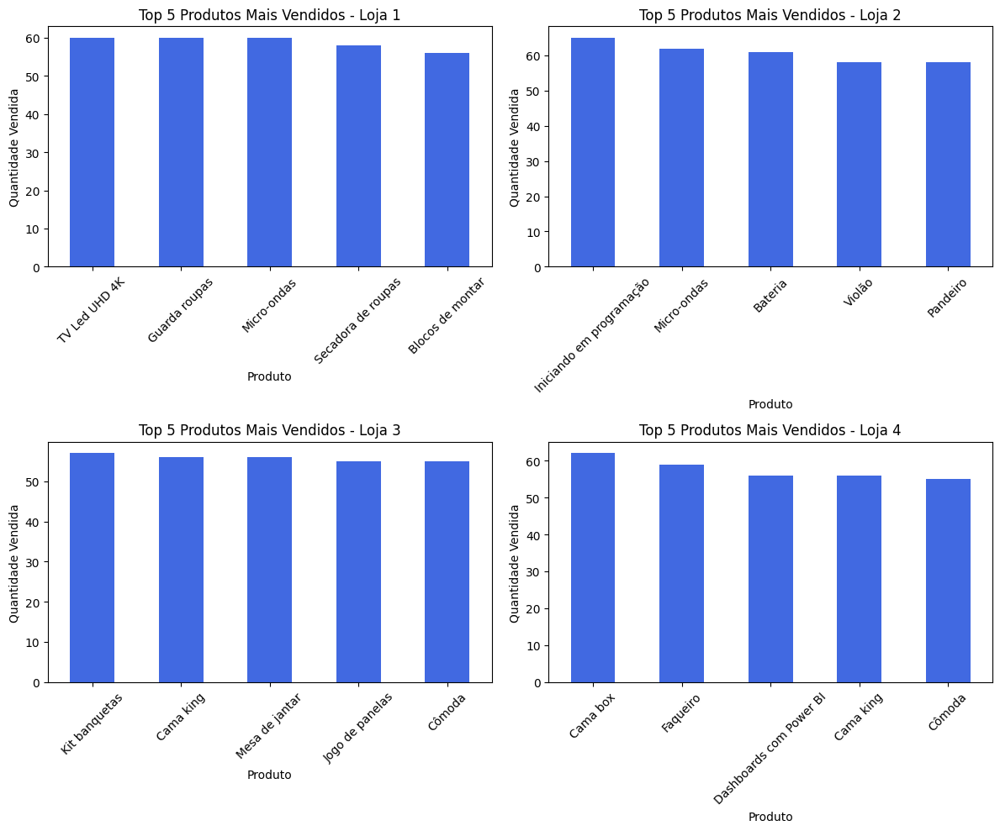

In [81]:
# Criando a figura com subplots para 4 lojas
fig, axes = plt.subplots(2, 2, figsize=(12,10))  # 2x2 para 4 lojas

# Lista com os DataFrames e títulos correspondentes
lojas = [loja, loja2, loja3, loja4]
titulos = ['Loja 1', 'Loja 2', 'Loja 3', 'Loja 4']

# Iterando sobre cada loja e gerando um gráfico separado
for i, (df, titulo) in enumerate(zip(lojas, titulos)):
    cont_produtos = df['Produto'].value_counts().head(5)
    ax = axes[i // 2, i % 2]  # Posicionando nos subplots
    
    cont_produtos.plot(kind='bar', ax=ax, color='royalblue')
    ax.set_title(f'Top 5 Produtos Mais Vendidos - {titulo}')
    ax.set_xlabel('Produto')
    ax.set_ylabel('Quantidade Vendida')
    ax.set_xticklabels(cont_produtos.index, rotation=45)

plt.tight_layout()
plt.show()

- Este gráfico ajuda a entender se há uma correlação entre o custo do frete e as avaliações dos clientes.

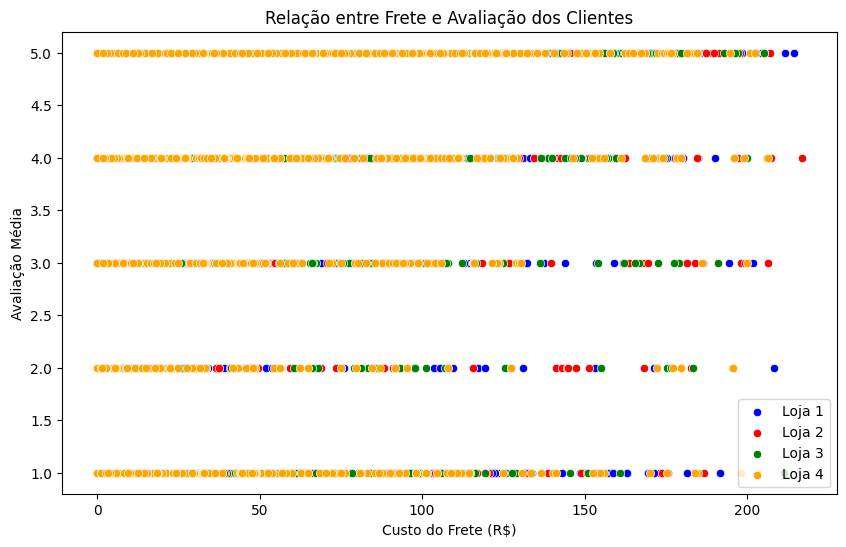

In [82]:
import seaborn as sns

plt.figure(figsize=(10,6))

sns.scatterplot(data=loja, x='Frete', y='Avaliação da compra', label='Loja 1', color='blue')
sns.scatterplot(data=loja2, x='Frete', y='Avaliação da compra', label='Loja 2', color='red')
sns.scatterplot(data=loja3, x='Frete', y='Avaliação da compra', label='Loja 3', color='green')
sns.scatterplot(data=loja4, x='Frete', y='Avaliação da compra', label='Loja 4', color='orange')

plt.title('Relação entre Frete e Avaliação dos Clientes')
plt.xlabel('Custo do Frete (R$)')
plt.ylabel('Avaliação Média')
plt.legend()
plt.show()

### O que esse gráfico nos mostra?
- Quais categorias de produtos têm maior participação nas vendas.
- Identificação de tendências de consumo entre as lojas.
- Insights para otimizar estoque e estratégias de vendas.


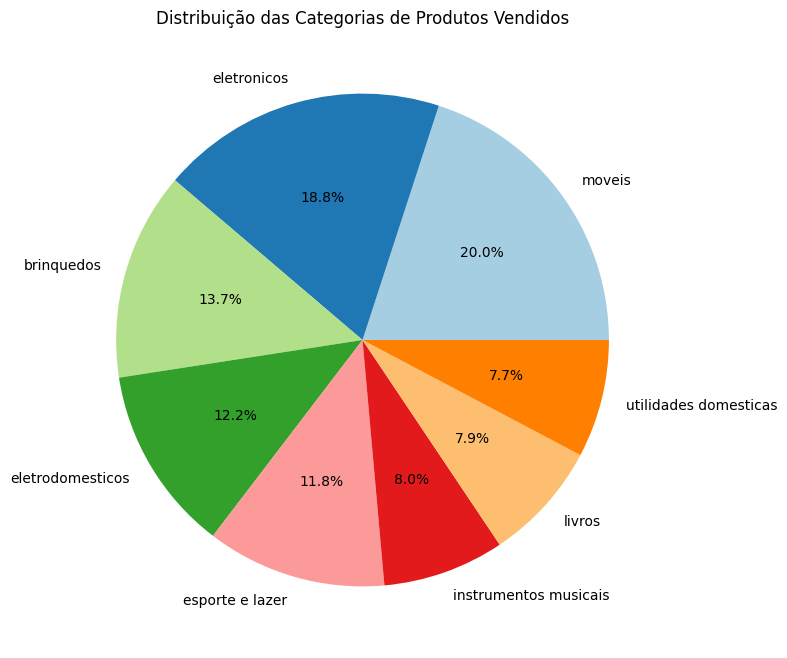

In [83]:
# Contagem de vendas por categoria em todas as lojas
categorias_vendas = pd.concat([loja['Categoria do Produto'], loja2['Categoria do Produto'], loja3['Categoria do Produto'], loja4['Categoria do Produto']])
contagem_categorias = categorias_vendas.value_counts()

# Criando o gráfico
plt.figure(figsize=(8,8))
plt.pie(contagem_categorias, labels=contagem_categorias.index, autopct='%1.1f%%', colors=plt.cm.Paired.colors)
plt.title('Distribuição das Categorias de Produtos Vendidos')
plt.show()

# **Relatório**

## **Análise e Apresentação dos Dados**  

###  **Total de Vendas por Loja**  
O gráfico de **total de pedidos por loja** revelou que a **Loja 3 tem um número significativamente menor de vendas** em comparação com as demais. Isso pode indicar baixa demanda pelos produtos dessa loja ou menor atratividade para os clientes. A **Loja 1** se destaca por possuir o maior volume de vendas.

###  **Distribuição das Categorias de Produtos Vendidos**  
A análise revelou que **as Lojas 1 e 2 apresentam uma maior diversidade de produtos**, enquanto a **Loja 3 tem menos variedade e vendas concentradas em poucos itens**. Isso pode indicar que a Loja 3 tem um catálogo menos competitivo, dificultando suas vendas.

###  **Top 5 Produtos Mais Vendidos**  
Os gráficos mostram que **as Lojas 1 e 2 possuem uma variedade maior de produtos populares**, enquanto **a Loja 3 tem menos produtos de alta saída**, o que pode comprometer sua rentabilidade a longo prazo. A **Loja 4**, embora tenha bons produtos, apresenta variação na demanda.

###  **Média das Avaliações dos Clientes**  
A **Loja 3 recebeu as avaliações mais baixas**, o que pode estar relacionado à qualidade dos produtos ou à experiência do consumidor. Por outro lado, **a Loja 1 teve a melhor média de avaliações**, sugerindo maior satisfação dos clientes com essa loja.

###  **Frete Médio por Loja**  
O gráfico mostrou que **a Loja 4 tem o frete mais caro**, o que pode ser um fator negativo para sua competitividade. Por outro lado, **a Loja 3 tem o frete mais barato**, mas seu baixo volume de vendas não compensa essa vantagem logística.

---

## **Conclusão e Recomendação**  
Com base nos gráficos e análises realizadas, recomenda-se que **o Senhor João venda a Loja 3** pelos seguintes motivos:

- **Baixo volume de vendas** em relação às outras lojas.  
- **Menor variedade de produtos** vendidos.  
- **Avaliações mais baixas**, indicando insatisfação dos clientes.  
- **Frete mais barato**, mas sem impacto significativo no crescimento da loja.  

Vendendo a Loja 3, **o Senhor João poderá focar nos negócios mais rentáveis e com maior potencial de crescimento**, garantindo um melhor retorno financeiro.  


# **Desafio Extra**

In [ ]:
from folium.plugins import HeatMap

# mapa centrado nas coordenadas médias
mapa = folium.Map(location=[loja['lat'].mean(), loja['lon'].mean()], zoom_start=10)

# Definindo cores para cada loja
cores_lojas = ['blue', 'red', 'green', 'orange']
lojas = [loja, loja2, loja3, loja4]
nomes_lojas = ['Loja 1', 'Loja 2', 'Loja 3', 'Loja 4']

# Adicionando pontos das vendas ao mapa com índice e frete
for df, nome_loja, cor in zip(lojas, nomes_lojas, cores_lojas):
    for idx, (lat, lon, frete) in enumerate(zip(df['lat'], df['lon'], df['Frete'])):
        folium.CircleMarker(
            location=[lat, lon], 
            radius=5, 
            color=cor, 
            fill=True, 
            fill_color=cor, 
            fill_opacity=0.6,
            popup=f'{nome_loja} - Índice: {idx} - Frete: R${frete:.2f}'  # Adicionando índice e custo do frete
        ).add_to(mapa)

# lista de coordenadas para o Heatmap
heat_data = []
for df in lojas:
    heat_data.extend(list(zip(df['lat'], df['lon'])))

# Adicionando Heatmap ao mapa
HeatMap(heat_data, radius=8, blur=10, min_opacity=0.5).add_to(mapa)

# Exibir o mapa
mapa